### Notebook for creation of anndata object of Xenium add-on panel healthy gut data and QC analysis
- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Created date:** 25th March 2024
- **Last modified date:** 10th April 2024

##### Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq

#### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                         10.2.0
anyio                       NA
arrow                       1.3.0
asciitree                   NA
asttokens                   NA
attr                        23.2.0
attrs                       23.2.0
babel                       2.14.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      1.1.0
certifi                     2023.11.17
cffi                        1.16.0
charset_normalizer          3.3.2
cloudpickle                 3.0.0
comm                        0.2.1
cycler                      0.12.1
cython_runtime              NA
dask                        2024.8.0
dask_image                  2023.08.1
datashader                  0.16.0
datatree                    0.0.13
dateutil                    2.8.2
debugpy                     1.8.0
decorator                   5.1.1
defusedxml                  0.7.1
docrep                   

#### Data upload

+ Upload anndata object

In [3]:
adata = sc.read_10x_h5(
    filename="data/10X_Xenium_adult_colon_data/raw_files/cell_feature_matrix.h5"
)

reading data/10X_Xenium_adult_colon_data/raw_files/cell_feature_matrix.h5
 (0:00:00)


+ Upload cell coordinates

In [4]:
df = pd.read_csv(
    "data/10X_Xenium_adult_colon_data/raw_files/cells.csv"
)

+ Add cell coordinates to anndata object

In [5]:
df.set_index(adata.obs_names, inplace=True)
adata.obs = df.copy()

In [6]:
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()

+ Add scale factors

In [7]:
scale_factors = {"tissue_hires_scalef": 1, #10X says to use these scale factors: 0.000006000112943, but plot looks weird with them, so I used 1
                "tissue_lowres_scalef": 1, #0.000024000451773
                "spot_diameter_fullres": 1} #squidpy tutorial used from 0,5 for Visium

In [8]:
spatial_key = "spatial"
library_id = "spatial"

In [9]:
adata.uns["spatial"] = dict()
adata.uns["spatial"][library_id] = dict()

In [10]:
adata.uns[spatial_key] = {library_id: {}}
adata.uns[spatial_key][library_id]["images"] = {}

In [11]:
adata.uns['spatial']['spatial']["scalefactors"] = scale_factors

#### Calculate quality control metrics

In [12]:
sc.pp.calculate_qc_metrics(adata, percent_top=False, inplace=True, log1p=False)

In [13]:
cprobes = (
    adata.obs["control_probe_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
cwords = (
    adata.obs["control_codeword_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
print(f"Negative DNA probe count % : {cprobes}")
print(f"Negative decoding count % : {cwords}")

Negative DNA probe count % : 0.004557884848285757
Negative decoding count % : 0.003657879377538216


<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

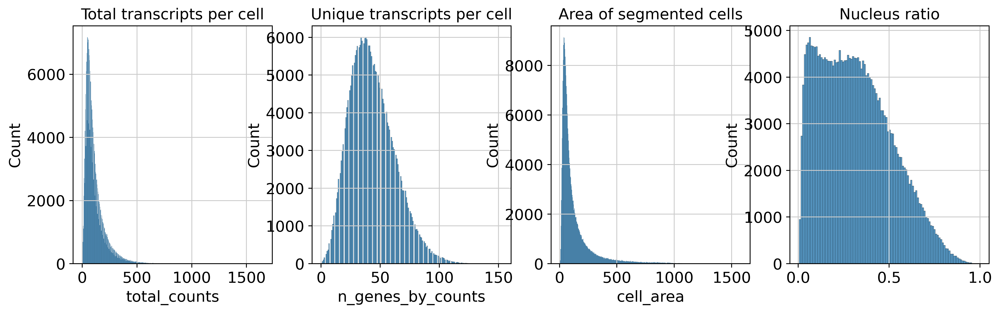

In [14]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)


axs[2].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

+ Filter the cells

In [15]:
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)

filtered out 1582 cells that have less than 10 counts


+ Visualize clusters

In [16]:
adata.layers["counts"] = adata.X.copy()

In [17]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [18]:
sc.pp.pca(adata)

computing PCA
    with n_comps=50


    finished (0:00:06)


In [19]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50


/home/amaguza/miniforge3/envs/squidpy_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:43)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:43)


In [20]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:07:40)


/home/amaguza/miniforge3/envs/squidpy_env/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


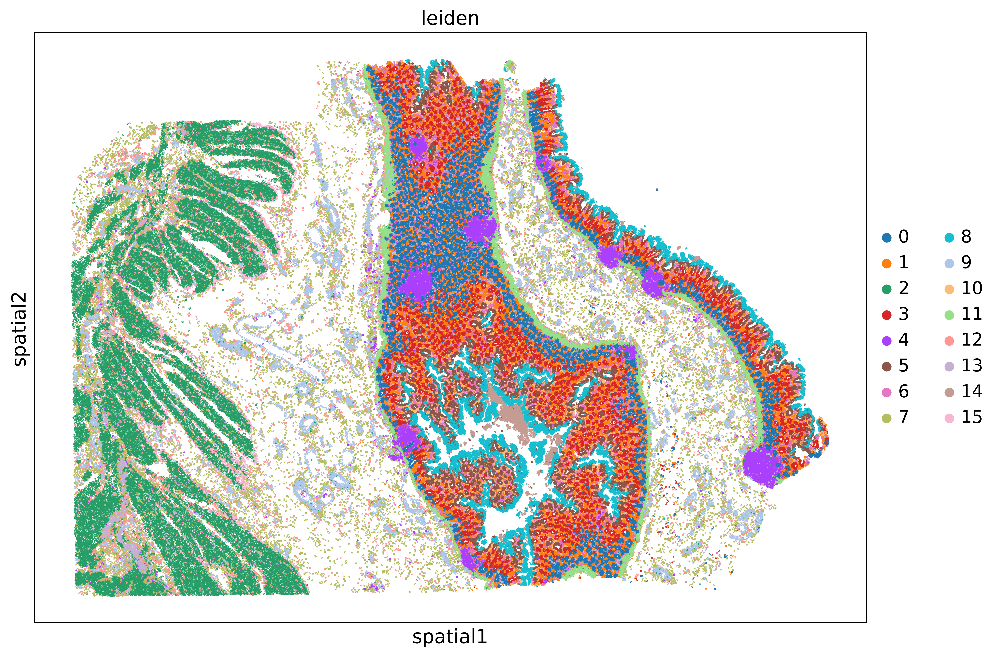

In [21]:
sc.set_figure_params(scanpy=True, dpi=300, figsize=(10, 10))
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
    ],
    wspace=0.4,
    size_key="tissue_hires_scalef" 
)

In [22]:
adata.X = adata.layers["counts"].copy()

In [23]:
adata.write_h5ad('data/10X_Xenium_adult_colon_data/raw_files/10X_Xenium_raw.h5ad')